# **Signal Processing Assignment 2**

### <u>Question 4</u>: 

### Explore the .mat structure. Load one scan from your case. Use whos to list variables; for each, give a one-line description (e.g., X_h X_v: complex I/Q arrays [az, r, p]; pri: PRT; az_set: azimuth centers; r_min, delr: range geometry; any calibration constants, etc.). State the dimensions of X_h and X_v and compute the unambiguous range and velocity given metadata (show formulas and numbers)

In [1]:
import numpy as np
from scipy.io import loadmat
import matplotlib.pyplot as plt
import pyart
from datetime import datetime
from matplotlib import rc

# plotting set up
plt.rcParams['axes.labelweight'] = 'normal'
plt.rcParams['text.latex.preamble'] = r'\usepackage{bm}'
rc('font', family='sans-serif')
rc('font', weight='normal', size=15)
rc('figure', facecolor='white')


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



Read in I/Q file

In [ ]:
dfile = "/Users/robbyfrost/Documents/Classes/Radar_Theory/SP2/KTLX_230226_032847248_01.mat"
ds = loadmat(dfile)
tplot = "20230227_" + dfile[-16:-10]
tplot = datetime.strptime(tplot, "%Y%m%d_%H%S%M")

print(ds.keys())

dict_keys(['__header__', '__version__', '__globals__', 'X_h', 'X_v', 'ZDRcal', 'Zcal', 'az_set', 'delr', 'el', 'lambda', 'num_az', 'num_gates', 'num_pulses', 'pri', 'r_min', 'radar', 'scan_time'])


In [3]:
for key in ds.keys():
    try:
        print(f"{key}, Shape: {ds[key].shape}")
    except:
        continue

X_h, Shape: (360, 1863, 15)
X_v, Shape: (360, 1863, 15)
ZDRcal, Shape: (1, 1)
Zcal, Shape: (1, 1)
az_set, Shape: (1, 360)
delr, Shape: (1, 1)
el, Shape: (1, 1)
lambda, Shape: (1, 1)
num_az, Shape: (1, 1)
num_gates, Shape: (1, 1)
num_pulses, Shape: (1, 1)
pri, Shape: (1, 1)
r_min, Shape: (1, 1)
radar, Shape: (1,)
scan_time, Shape: (1, 6)


### <u>Question 5</u>:

### Power PPI via R0. Explain this operation (time-average of instantaneous power; R0). Produce power PPIs for H and V (dB scale). Overlay the basemap. Annotate at least two salient features appropriate to your case:
### •Severe/QLCS: hook/appendage, rear-inflow notch, reflectivity gradient.
### •Snow/stratiform: bright band annulus, stratiform shield vs. embedded convection.
### •Smoke: plume core/sides, lofted layers vs. boundary layer returns.
### Also mark any artifacts (e.g., fixed clutter, range sidelobes, blockages).

In [4]:
Xh = ds['X_h']
Xv = ds['X_v']
num_pulses = int(ds['num_pulses'][0,0])
rmin = float(ds['r_min'][0,0])
delr = float(ds['delr'][0,0])
rmax = rmin + delr*Xh.shape[1]
ZDRcal = ds['ZDRcal']

powh_lin = np.real(np.nanmean(Xh[:,:,1:num_pulses] * np.conj(Xh[:,:,1:num_pulses]), axis=2))
powh = 10 * np.log10(powh_lin)
powv_lin = np.real(np.nanmean(Xv[:,:,1:num_pulses] * np.conj(Xv[:,:,1:num_pulses]), axis=2))
powv_lin = powv_lin
powv = 10 * np.log10(powv_lin) - ZDRcal

r = np.arange(rmin, rmax, delr)
az = ds['az_set'][0,:]

x = r[:,np.newaxis].dot(np.sin(np.deg2rad(az[np.newaxis,:]))).T
y = r[:,np.newaxis].dot(np.cos(np.deg2rad(az[np.newaxis,:]))).T

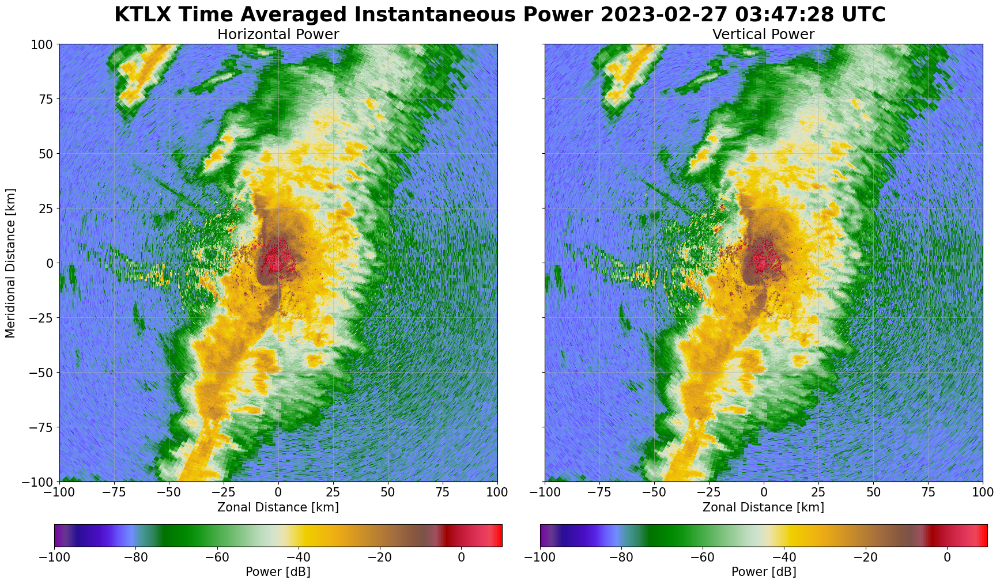

In [5]:
fig, axs = plt.subplots(figsize=(17.40,10), 
                       dpi=100,
                       constrained_layout=True,
                       ncols=2,
                       sharey=True)
fig.suptitle(f"KTLX Time Averaged Instantaneous Power {tplot} UTC",
             fontsize=25, 
             fontweight='bold')

ax = axs[0]
pcm = ax.pcolormesh(x/1e3, y/1e3, powh,
                    vmin=-100, vmax=10,
                    cmap='Carbone42')
cbar = plt.colorbar(pcm, ax=ax, label="Power [dB]", orientation='horizontal', pad=0.02)
ax.set_title("Horizontal Power")
ax.set_ylabel("Meridional Distance [km]")

ax = axs[1]
pcm = ax.pcolormesh(x/1e3, y/1e3, powv,
                    vmin=-100, vmax=10,
                    cmap='Carbone42')
cbar = plt.colorbar(pcm, ax=ax, label="Power [dB]", orientation='horizontal', pad=0.02)
ax.set_title("Vertical Power")

for ax in axs:
    ax.set_aspect('equal')
    ax.set_xlim(-100,100)
    ax.set_ylim(-100,100)
    ax.grid(alpha=0.5)
    ax.set_xlabel('Zonal Distance [km]')

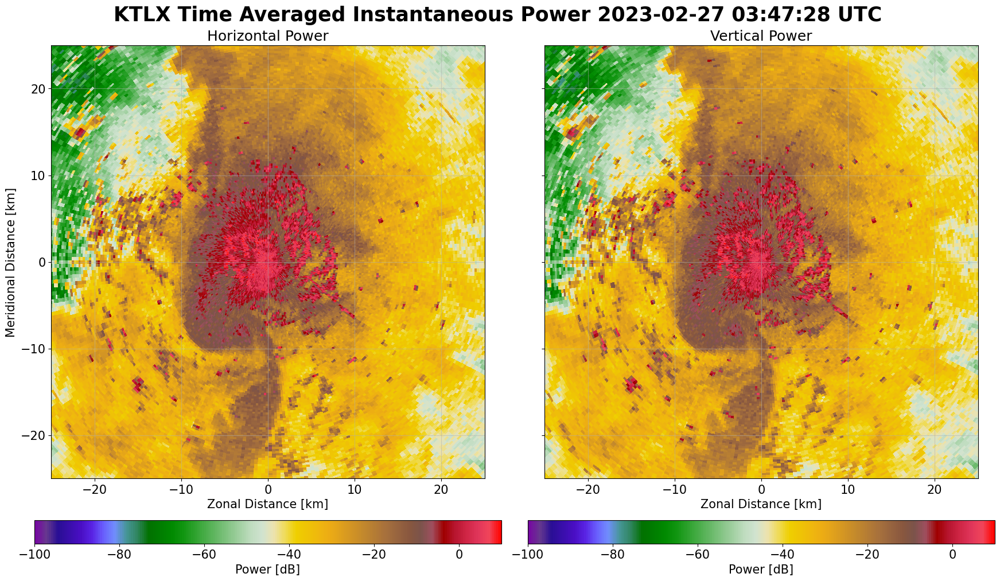

In [6]:
fig, axs = plt.subplots(figsize=(17.40,10), 
                       dpi=100,
                       constrained_layout=True,
                       ncols=2,
                       sharey=True)
fig.suptitle(f"KTLX Time Averaged Instantaneous Power {tplot} UTC",
             fontsize=25, 
             fontweight='bold')

ax = axs[0]
pcm = ax.pcolormesh(x/1e3, y/1e3, powh,
                    vmin=-100, vmax=10,
                    cmap='Carbone42')
cbar = plt.colorbar(pcm, ax=ax, label="Power [dB]", orientation='horizontal', pad=0.02)
ax.set_title("Horizontal Power")
ax.set_ylabel("Meridional Distance [km]")

ax = axs[1]
pcm = ax.pcolormesh(x/1e3, y/1e3, powv,
                    vmin=-100, vmax=10,
                    cmap='Carbone42')
cbar = plt.colorbar(pcm, ax=ax, label="Power [dB]", orientation='horizontal', pad=0.02)
ax.set_title("Vertical Power")

for ax in axs:
    ax.set_aspect('equal')
    ax.set_xlim(-25,25)
    ax.set_ylim(-25,25)
    ax.grid(alpha=0.5)
    ax.set_xlabel('Zonal Distance [km]')

### <u>Question 6</u>:

### Compare H vs. V power. Retain separate estimates as powh, powv. Plot both and discuss where they diverge physically for your case. Map powdiff and interpret (e.g., anisotropic scattering in ice aggregates; attenuation; non-meteorological targets in smoke; differential calibration hints). If available, comment on elevation dependence.

In [7]:
pow_diff = powh - powv
noiseh = np.nanmean(powh_lin[:,-100:-50])
noisev = np.nanmean(powv_lin[:,-100:-50])
noise = (noiseh + noisev) / 2

snr = ((powh_lin + powv_lin)/2) / noise
snr = 10 * np.log10(snr)

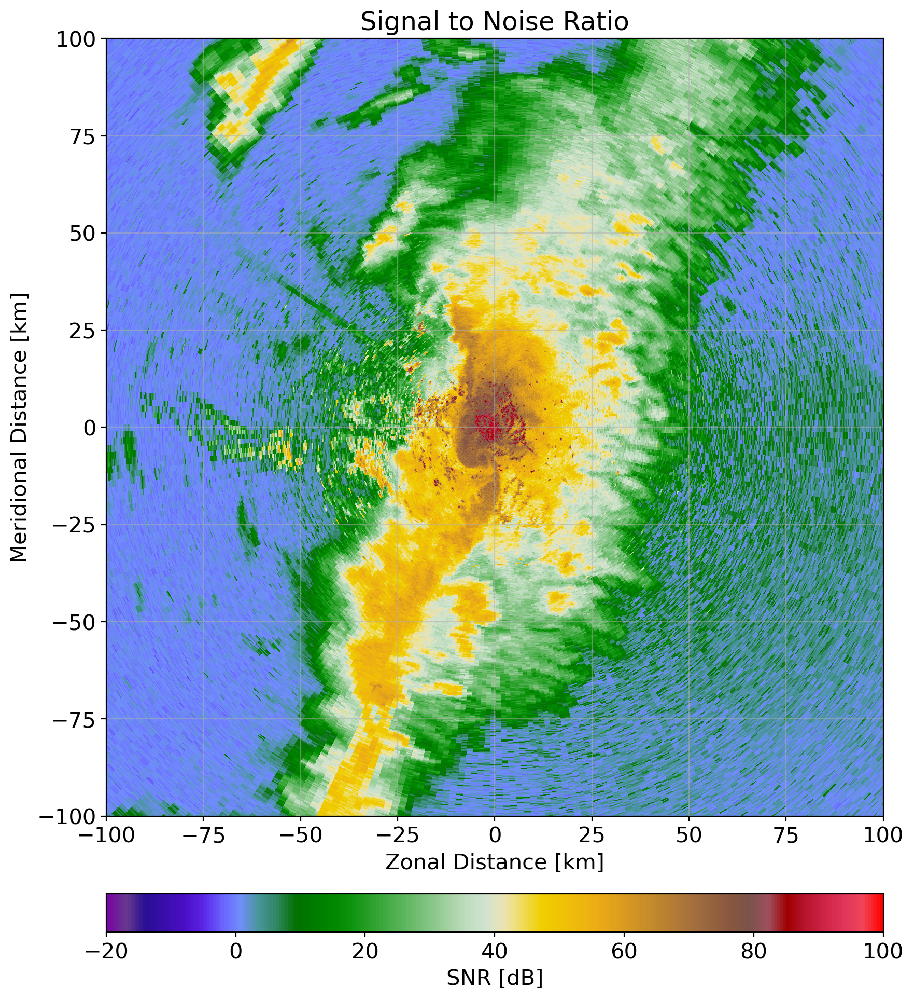

In [8]:
fig, ax = plt.subplots(figsize=(8.70,10),
                       dpi=200,
                       constrained_layout=True,
                       ncols=1)

pcm = ax.pcolormesh(x/1e3, y/1e3, snr,
                    vmin=-20, vmax=100,
                    cmap='Carbone42')
cbar = plt.colorbar(pcm, ax=ax, label="SNR [dB]", orientation='horizontal', pad=0.02)
ax.set_title("Signal to Noise Ratio")
ax.set_xlabel('Zonal Distance [km]')

ax.set_ylabel("Meridional Distance [km]")
ax.set_aspect('equal')
ax.set_xlim(-100,100)
ax.set_ylim(-100,100)
ax.grid(alpha=0.5)

In [12]:
snr_mask = (snr > 20)
pow_diff_masked = np.where(snr_mask, pow_diff, np.nan)

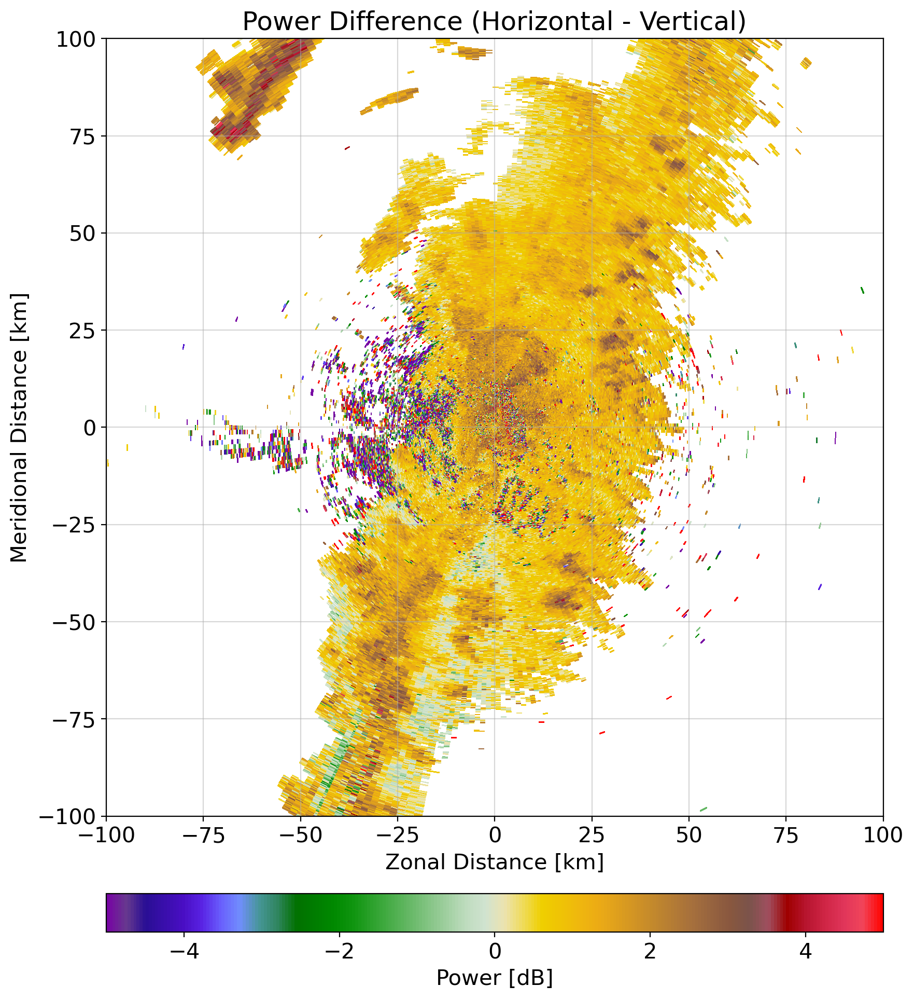

In [13]:
fig, ax = plt.subplots(figsize=(8.70,10),
                       dpi=200,
                       constrained_layout=True,
                       ncols=1)

pcm = ax.pcolormesh(x/1e3, y/1e3, pow_diff_masked,
                    vmin=-5, vmax=5,
                    cmap='Carbone42')
cbar = plt.colorbar(pcm, ax=ax, label="Power [dB]", orientation='horizontal', pad=0.02)
ax.set_title("Power Difference (Horizontal - Vertical)")
ax.set_xlabel('Zonal Distance [km]')

ax.set_ylabel("Meridional Distance [km]")
ax.set_aspect('equal')
ax.set_xlim(-100,100)
ax.set_ylim(-100,100)
ax.grid(alpha=0.5)

### <u>Question 7</u>:

### I/Q inspection across regimes. For at least three distinct gates and both polarizations, plot I(t) and Q(t) on one figure with time on the x-axis. Choose examples representing (a) weather echo, (b) ground clutter (near range), and (c) clear air (far range). Use r_min, delr, and az_set to report range and azimuth in the title. Describe qualitative differences in amplitude/phase wander and what they imply about Doppler frequency and SNR.

In [14]:
# weather echo
xw, yw = -5*1e3, -8*1e3
rw = np.sqrt(xw**2 + yw**2)
rw_idx = np.argmin(np.abs(r-rw))
azw = np.rad2deg(np.arctan2(xw,yw)) % 360
azw_idx = np.argmin(np.abs(az-azw))
# clutter echo
xc, yc = 7*1e3, 0
rc = np.sqrt(xc**2 + yc**2)
rc_idx = np.argmin(np.abs(r-rc))
azc = np.rad2deg(np.arctan2(xc,yc)) % 360
azc_idx = np.argmin(np.abs(az-azc))
# clear-air echo
xca, yca = 75*1e3, -25*1e3
rca = np.sqrt(xca**2 + yca**2)
rca_idx = np.argmin(np.abs(r-rca))
azca = np.rad2deg(np.arctan2(xca,yca)) % 360
azca_idx = np.argmin(np.abs(az-azca))

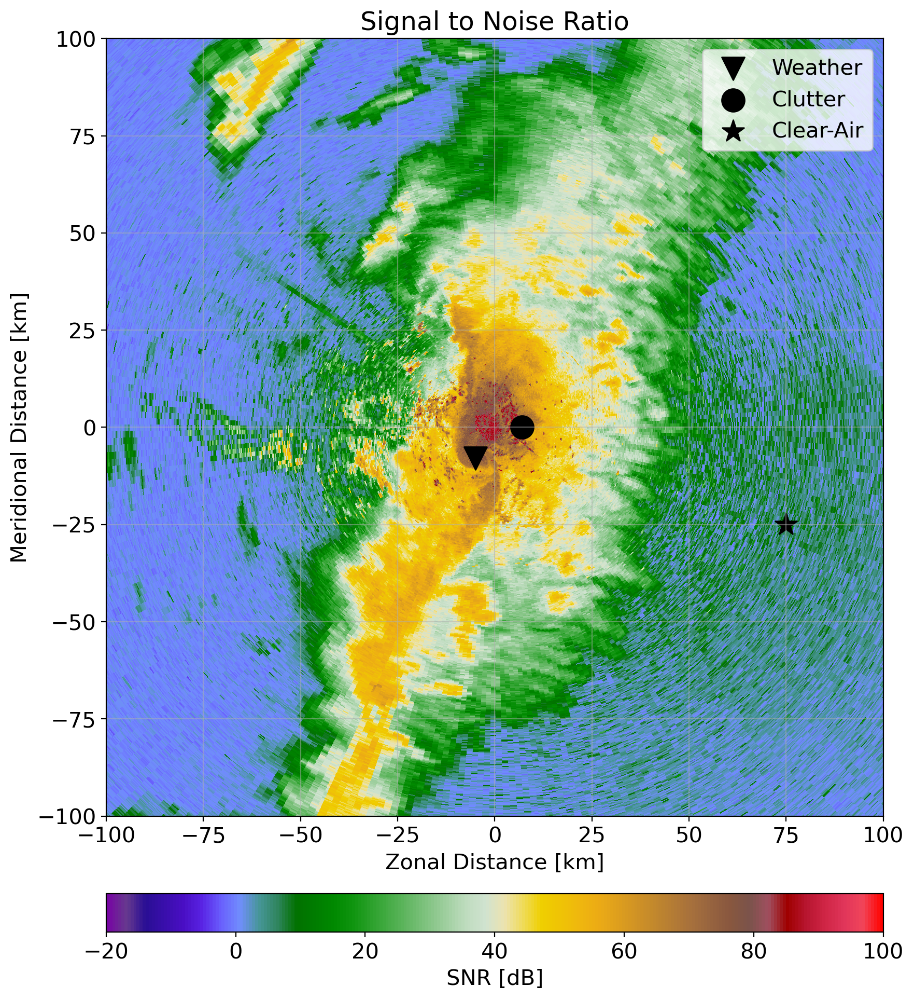

In [15]:
fig, ax = plt.subplots(figsize=(8.70,10),
                       dpi=200,
                       constrained_layout=True,
                       ncols=1)

pcm = ax.pcolormesh(x/1e3, y/1e3, snr,
                    vmin=-20, vmax=100,
                    cmap='Carbone42')
cbar = plt.colorbar(pcm, ax=ax, label="SNR [dB]", orientation='horizontal', pad=0.02)
ax.set_title("Signal to Noise Ratio")
ax.set_xlabel('Zonal Distance [km]')

ax.scatter(xw/1e3, yw/1e3, marker='v', s=250, c='black', label='Weather')
ax.scatter(xc/1e3, yc/1e3, marker='o', s=250, c='black', label='Clutter')
ax.scatter(xca/1e3, yca/1e3, marker='*', s=250, c='black', label='Clear-Air')
ax.legend()

ax.set_ylabel("Meridional Distance [km]")
ax.set_aspect('equal')
ax.set_xlim(-100,100)
ax.set_ylim(-100,100)
ax.grid(alpha=0.5)

In [16]:
I = np.real(Xh)
Q = np.imag(Xh)
prt = ds['pri'][0,0]
time = np.arange(0,num_pulses)*prt

Iw = I[azw_idx,rw_idx]
Qw = Q[azw_idx,rw_idx]

Ic = I[azc_idx,rc_idx]
Qc = Q[azc_idx,rc_idx]

Ica = I[azca_idx,rca_idx]
Qca = Q[azca_idx,rca_idx]

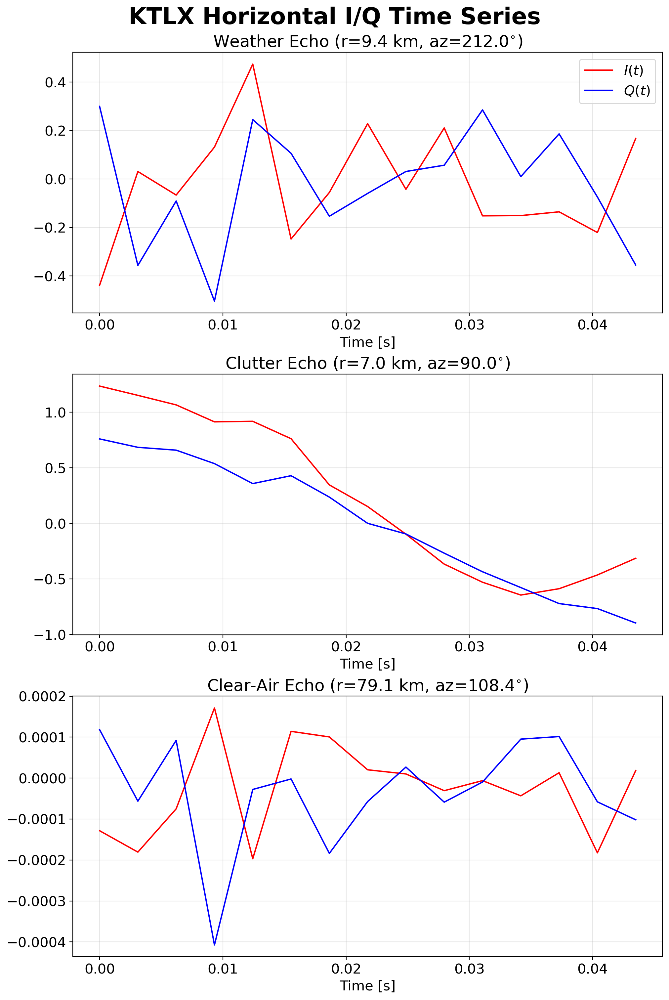

In [17]:
fig, axs = plt.subplots(figsize=(10,15),
                       ncols=1,
                       nrows=3,
                       constrained_layout=True,
                       dpi=200)
fig.suptitle("KTLX Horizontal I/Q Time Series",
             fontsize=25,
             fontweight='bold')
# weather
ax = axs[0]
ax.plot(time, Iw, c='red', label='$I(t)$')
ax.plot(time, Qw, c='blue', label="$Q(t)$")
ax.legend()
ax.set_title(f"Weather Echo (r={(rw/1e3):.1f} km, az={azw:.1f}$^{{\\circ}}$)")
# clutter
ax = axs[1]
ax.plot(time, Ic, c='red')
ax.plot(time, Qc, c='blue')
ax.set_title(f"Clutter Echo (r={(rc/1e3):.1f} km, az={azc:.1f}$^{{\\circ}}$)")
# clear-air
ax = axs[2]
ax.plot(time, Ica, c='red')
ax.plot(time, Qca, c='blue')
ax.set_title(f"Clear-Air Echo (r={(rca/1e3):.1f} km, az={azca:.1f}$^{{\\circ}}$)")

# clean up
for ax in axs:
    ax.set_xlabel("Time [s]")
    ax.grid(alpha=0.3)

In [18]:
I = np.real(Xv)
Q = np.imag(Xv)
prt = ds['pri'][0,0]
time = np.arange(0,num_pulses)*prt

Iw = I[azw_idx,rw_idx]
Qw = Q[azw_idx,rw_idx]

Ic = I[azc_idx,rc_idx]
Qc = Q[azc_idx,rc_idx]

Ica = I[azca_idx,rca_idx]
Qca = Q[azca_idx,rca_idx]

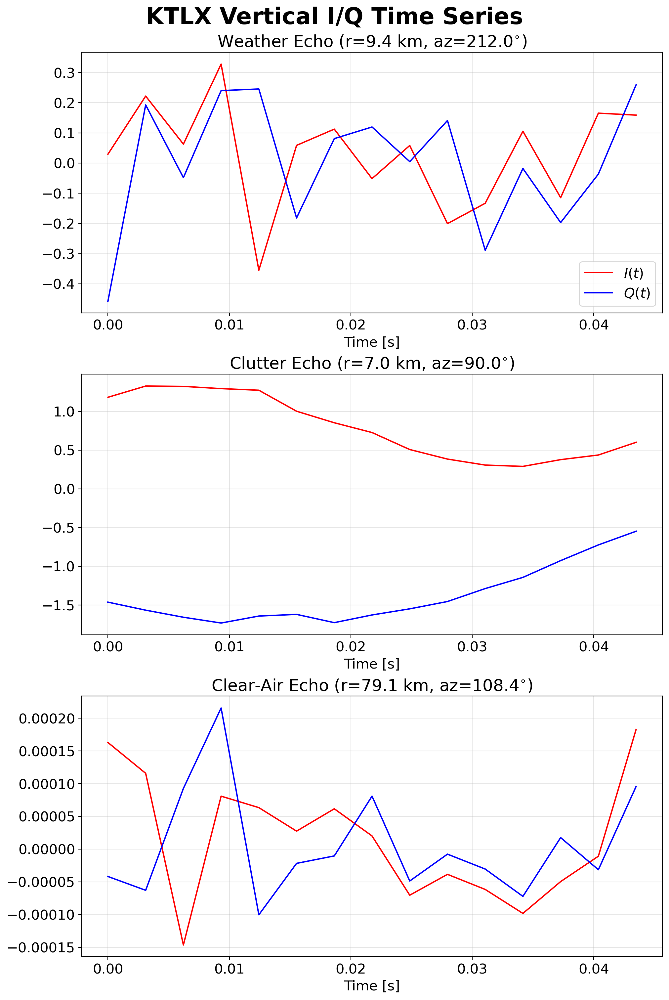

In [19]:
fig, axs = plt.subplots(figsize=(10,15),
                       ncols=1,
                       nrows=3,
                       constrained_layout=True,
                       dpi=200)
fig.suptitle("KTLX Vertical I/Q Time Series",
             fontsize=25,
             fontweight='bold')
# weather
ax = axs[0]
ax.plot(time, Iw, c='red', label='$I(t)$')
ax.plot(time, Qw, c='blue', label="$Q(t)$")
ax.legend()
ax.set_title(f"Weather Echo (r={(rw/1e3):.1f} km, az={azw:.1f}$^{{\\circ}}$)")
# clutter
ax = axs[1]
ax.plot(time, Ic, c='red')
ax.plot(time, Qc, c='blue')
ax.set_title(f"Clutter Echo (r={(rc/1e3):.1f} km, az={azc:.1f}$^{{\\circ}}$)")
# clear-air
ax = axs[2]
ax.plot(time, Ica, c='red')
ax.plot(time, Qca, c='blue')
ax.set_title(f"Clear-Air Echo (r={(rca/1e3):.1f} km, az={azca:.1f}$^{{\\circ}}$)")

# clean up
for ax in axs:
    ax.set_xlabel("Time [s]")
    ax.grid(alpha=0.3)

### <u>Question 8</u>:

### For one weather gate, hand-estimate Doppler frequency from the I/Q phasor evolution and convert to radial velocity (state wavelength/PRT used). Discuss uncertainty sources (noise, spectrum width, clutter leakage, phase unwrap ambiguity) and how they relate to your case (e.g., broader spectra in convection; narrow in stratiform snow; low SNR for smoke).

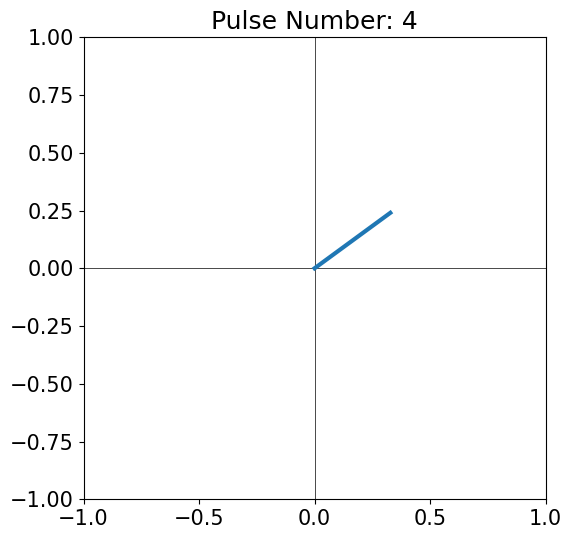

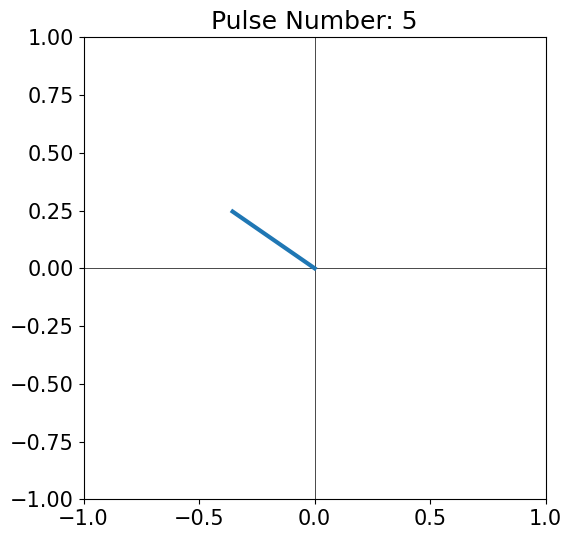

In [20]:
for jt in [3,4]:

        fig, ax = plt.subplots(figsize=(6,6))

        ax.plot([0,Iw[jt]], [0,Qw[jt]], 
                lw=3,
                zorder=2)

        ax.set_aspect('equal')
        ax.set_title(f"Pulse Number: {jt+1}")

        ax.set_xlim(-1,1)
        ax.set_ylim(-1,1)
        ax.axvline(x=0, lw=0.5, c='black', zorder=1)
        ax.axhline(y=0, lw=0.5, c='black', zorder=1)

        plt.show()
        plt.close()

In [21]:
phi = (np.atan2(Qw, Iw) + 2*np.pi) % (2*np.pi)
pulse = np.arange(1,num_pulses+0.1,1)

Text(0.5, 0, 'Pulse Number')

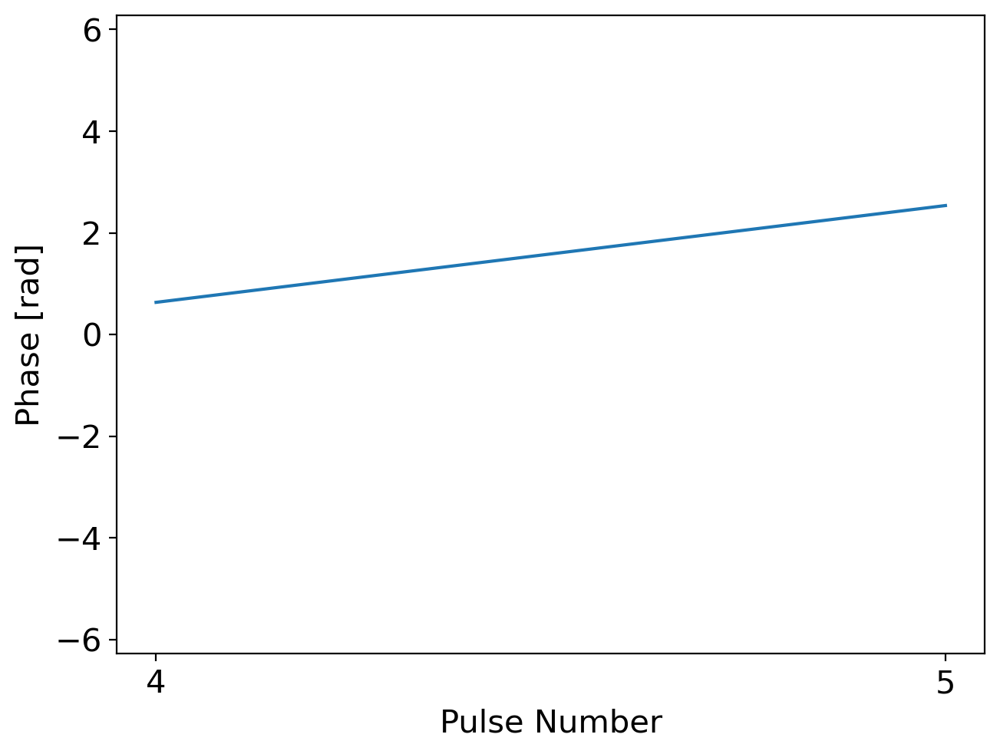

In [22]:
fig, ax = plt.subplots(constrained_layout=True, dpi=200)

ax.plot(pulse[3:5], phi[3:5], label='Phase')

ax.set_ylabel("Phase [rad]")
ax.set_ylim(-2*np.pi, 2*np.pi)
ax.set_xticks([4,5])
ax.set_xlabel("Pulse Number")

In [23]:
fd = (phi[4] - phi[3]) / (time[4] - time[3])
print(fd)

612.979024998467


In [24]:
Vr = (0.1/2) * fd
print(Vr) 

30.648951249923353


### <u>Question 9</u>

### Doppler velocity via lag-1 ACF. Let xn be the complex I/Q at a fixed gate/polarization for n = 0,...,N −1 pulses with PRT Ts. Use the (biased) sample ACF.

In [40]:
dfile = '/Users/robbyfrost/Documents/Classes/Radar_Theory/SP2/KTLX_230226_032905181_02.mat'
ds = loadmat(dfile)
tplot = "20230227_" + dfile[-16:-10]
tplot = datetime.strptime(tplot, "%Y%m%d_%H%S%M")

Xh = ds['X_h']
Xv = ds['X_v']
num_pulses = int(ds['num_pulses'][0,0])
rmin = float(ds['r_min'][0,0])
delr = float(ds['delr'][0,0])
rmax = rmin + delr*Xh.shape[1]
ZDRcal = ds['ZDRcal']

powh_lin = np.real(np.nanmean(Xh[:,:,1:num_pulses] * np.conj(Xh[:,:,1:num_pulses]), axis=2))
powh = 10 * np.log10(powh_lin)
powv_lin = np.real(np.nanmean(Xv[:,:,1:num_pulses] * np.conj(Xv[:,:,1:num_pulses]), axis=2))
powv_lin = powv_lin
powv = 10 * np.log10(powv_lin) - ZDRcal

r = np.arange(rmin, rmax, delr)
az = ds['az_set'][0,:]

x = r[:,np.newaxis].dot(np.sin(np.deg2rad(az[np.newaxis,:]))).T
y = r[:,np.newaxis].dot(np.cos(np.deg2rad(az[np.newaxis,:]))).T

In [41]:
k = 1
R1 = (1/num_pulses) * np.nansum(Xh[:,:,k:num_pulses] * np.conj(Xh[:,:,0:num_pulses-k]), axis=2)
R0 = (1/num_pulses) * np.nansum(np.abs(Xh)**2)

In [43]:
fd = (np.angle(R1)) / (2*np.pi*prt)
Vr = (0.1/2) * fd

snr = ((powh_lin + powv_lin)/2) / noise
snr = 10 * np.log10(snr)
snr_mask = (snr > 20)
Vr_masked = np.where(snr_mask, Vr, np.nan)

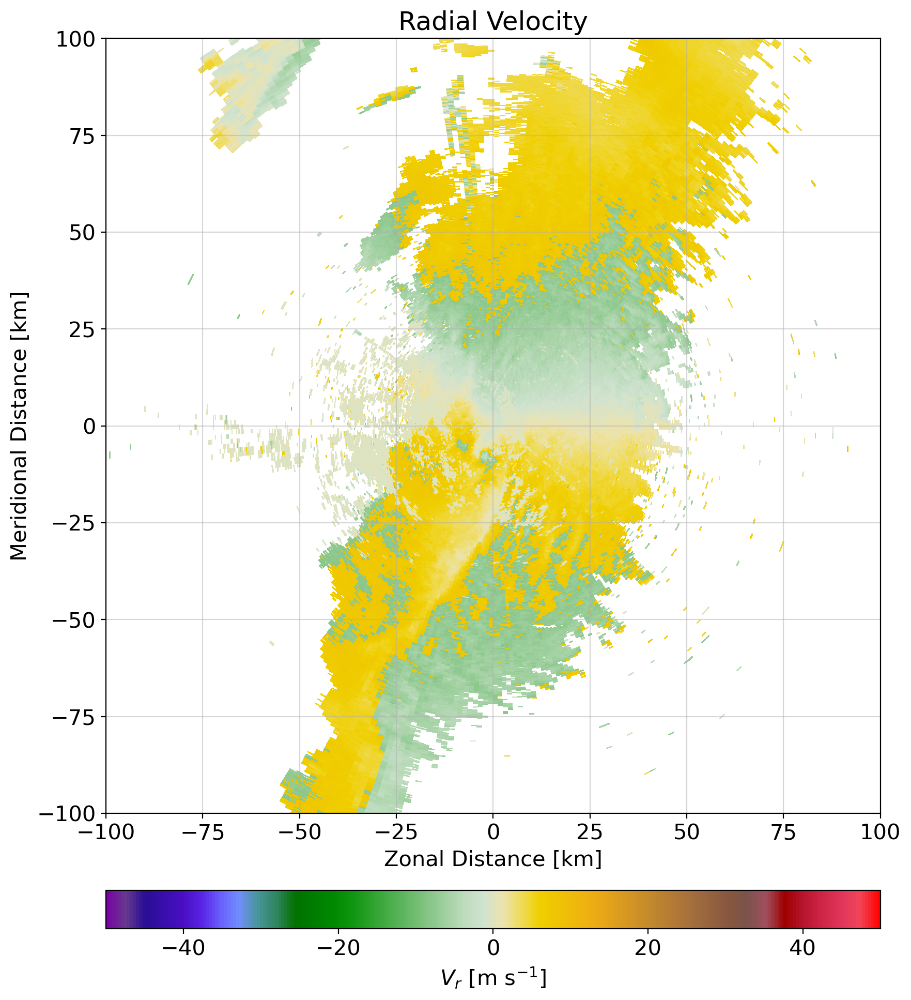

In [44]:
fig, ax = plt.subplots(figsize=(8.70,10),
                       dpi=200,
                       constrained_layout=True,
                       ncols=1)

pcm = ax.pcolormesh(x/1e3, y/1e3, Vr_masked,
                    vmin=-50, vmax=50,
                    cmap='Carbone42')
cbar = plt.colorbar(pcm, ax=ax, label="$V_r$ [m s$^{-1}$]", orientation='horizontal', pad=0.02)

ax.set_title("Radial Velocity")
ax.set_xlabel('Zonal Distance [km]')
ax.set_ylabel("Meridional Distance [km]")
ax.set_aspect('equal')
ax.set_xlim(-100,100)
ax.set_ylim(-100,100)
ax.grid(alpha=0.5)